# RCAP Demo

**RCAP** (Recovered image Confidence during Progressive image recovery) is a quantitative metric for evaluating the quality of XAI saliency maps.

## How it works

Given a saliency map, RCAP progressively recovers the image from black, starting from the most salient regions:

```
Black image → reveal top-X% salient pixels → reveal top-Y% → ... → full image
```

At each recovery stage, the model's prediction confidence is measured. A **good** saliency map concentrates on truly important regions, so confidence should recover quickly with few pixels revealed.

## Key outputs

| Output | Description |
|--------|-------------|
| `visual_noise_level` | Ratio of local to overall saliency (how focused the map is) |
| `localization` | Model confidence at each recovery stage |
| `RCAP` | Main score = `(visual_noise_level × localization).mean()` — higher is better |

## 1. Setup

In [1]:
import os
import urllib.request

import numpy as np
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

from mlxops_xai import (
    vanilla_gradient,
    smooth_grad,
    integrated_gradients,
    guided_back_propagation,
    guided_absolute_grad,
    guided_ig,
    blur_integrated_gradients,
)
from mlxops_xai.rcap import RCAP

if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

Using device: mps


## 2. Load Model and Images

In [2]:
model = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V1)
model = model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

BASE_URL = "https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/master/"
SAMPLES = {
    "tench":            "n01440764_tench.JPEG",
    "goldfish":         "n01443537_goldfish.JPEG",
    "golden_retriever": "n02099601_golden_retriever.JPEG",
    "elephant":         "n02504013_Indian_elephant.JPEG",
}

os.makedirs("demo_images", exist_ok=True)
images_pil = {}
for name, fname in SAMPLES.items():
    path = os.path.join("demo_images", fname)
    if not os.path.exists(path):
        req = urllib.request.Request(BASE_URL + fname, headers={"User-Agent": "Mozilla/5.0"})
        with urllib.request.urlopen(req) as resp, open(path, "wb") as f:
            f.write(resp.read())
    images_pil[name] = Image.open(path).convert("RGB")

input_tensor = torch.stack([preprocess(img) for img in images_pil.values()]).to(device)
sample_names = list(images_pil.keys())

with torch.no_grad():
    outputs = model(input_tensor)
    targets = outputs.argmax(dim=1)

print(f"Batch shape: {input_tensor.shape}")
print(f"Predicted classes: {targets.tolist()}")

Batch shape: torch.Size([4, 3, 224, 224])
Predicted classes: [0, 1, 207, 385]


## 3. Run RCAP — Single Batch (one-shot)

`RCAP` follows the **torchmetrics** `Metric` API:
- **`evaluate()`** — convenience method for a single batch (calls `update` + `compute` + `reset` internally)
- **`update()` + `compute()`** — for full-dataset evaluation across multiple batches (see Section 4)

Key parameters:
- `lower_bound`: starting quantile for recovery (default `0.7` = reveal top 30% first)
- `recover_interval`: step size between recovery stages (default `0.3`)

In [3]:
rcap = RCAP(lower_bound=0.5, recover_interval=0.1)

sal = guided_absolute_grad(model, input_tensor[:2], targets[:2])

# Single-batch one-shot: evaluate() = update() + compute() + reset()
result = rcap.evaluate(
    model=model,
    batch=(input_tensor[:2], targets[:2]),
    saliency_maps=sal,
)

print("Keys:", list(result.keys()))
print()
print(f"original_pred_prob  (model conf on full image):  {result['original_pred_prob'].flatten()}")
print(f"recovered_pred_prob (model conf at each stage):\n{result['recovered_pred_prob']}")
print()
print("RCAP scores per image:", result['overall_rcap']['RCAP'])

Keys: ['original_pred_score', 'recovered_pred_score', 'original_pred_prob', 'recovered_pred_prob', 'local_heat_mean', 'local_heat_sum', 'overall_heat_mean', 'overall_heat_sum', 'all_original_pred_prob_full', 'all_recovered_pred_prob_full', 'overall_rcap']

original_pred_prob  (model conf on full image):  tensor([0.9643, 0.7991])
recovered_pred_prob (model conf at each stage):
tensor([[3.7250e-08, 1.4099e-05, 5.1068e-02, 1.0407e-01, 5.6128e-01],
        [2.8084e-05, 3.6077e-04, 1.6824e-01, 8.3160e-01, 9.4505e-01]])

RCAP scores per image: tensor([0.1077, 0.2711])


## 4. Run RCAP — Multi-batch (full dataset)

For a full dataset split into multiple batches, use `update()` per batch and `compute()` once at the end.
State accumulates across batches and is cleared automatically after `compute()`.

```python
# Typical training-loop pattern
rcap = RCAP(lower_bound=0.5, recover_interval=0.1)

for batch, saliency_maps in dataloader:
    rcap.update(model, batch, saliency_maps)

result = rcap.compute()   # aggregates all batches
rcap.reset()              # ready for next epoch
```

Below we simulate this by splitting our 4-image batch into two mini-batches of 2.

In [4]:
sal_all = guided_absolute_grad(model, input_tensor, targets)

# Simulate two mini-batches
mini_batches = [
    ((input_tensor[:2], targets[:2]), sal_all[:2]),
    ((input_tensor[2:], targets[2:]), sal_all[2:]),
]

rcap = RCAP(lower_bound=0.5, recover_interval=0.1)

for batch, sal in mini_batches:
    rcap.update(model, batch, sal.to(device))

# Compute once over all accumulated samples
result_full = rcap.compute()
rcap.reset()

print(f"Total samples aggregated: {result_full['recovered_pred_prob'].shape[0]}")
print("RCAP scores per image:", result_full['overall_rcap']['RCAP'].round(decimals=4))

Total samples aggregated: 4
RCAP scores per image: tensor([2.1270e-01, 3.2290e-01, 2.8740e-01, 2.0000e-04])


## 5. Visualize Progressive Recovery Across Methods

For each image: rows = methods, columns = recovery stages (most salient first) + full image.

Computing Vanilla Gradient... done
Computing SmoothGrad... done
Computing Integrated Grad... done
Computing Guided Backprop... done
Computing Guided Abs Grad... done
Computing Guided IG... done
Computing Blur IG... done


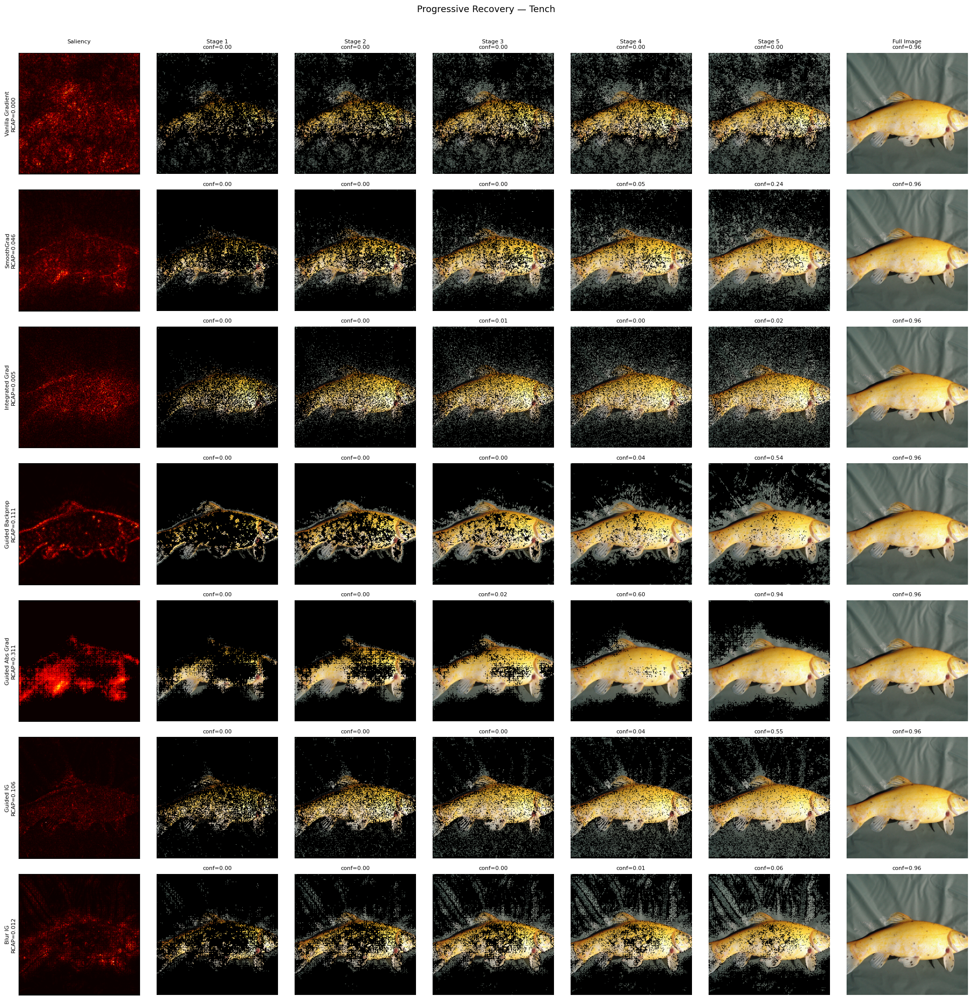

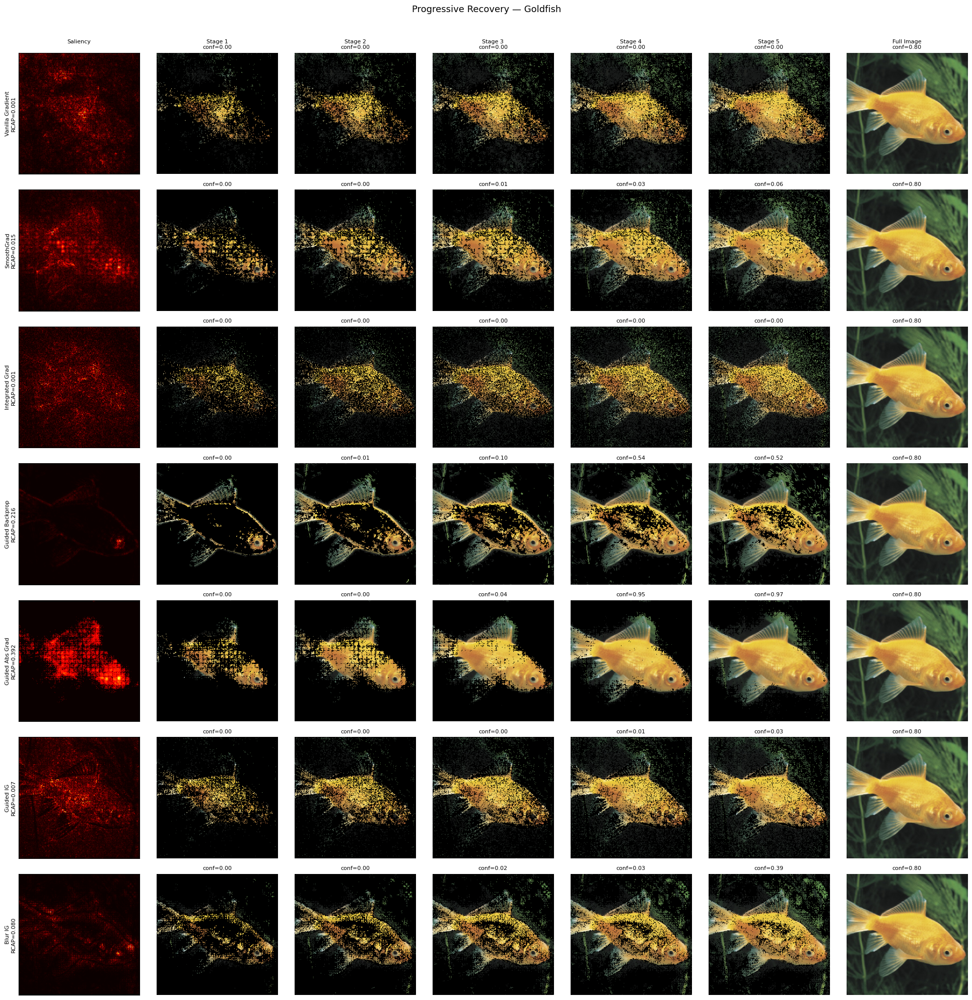

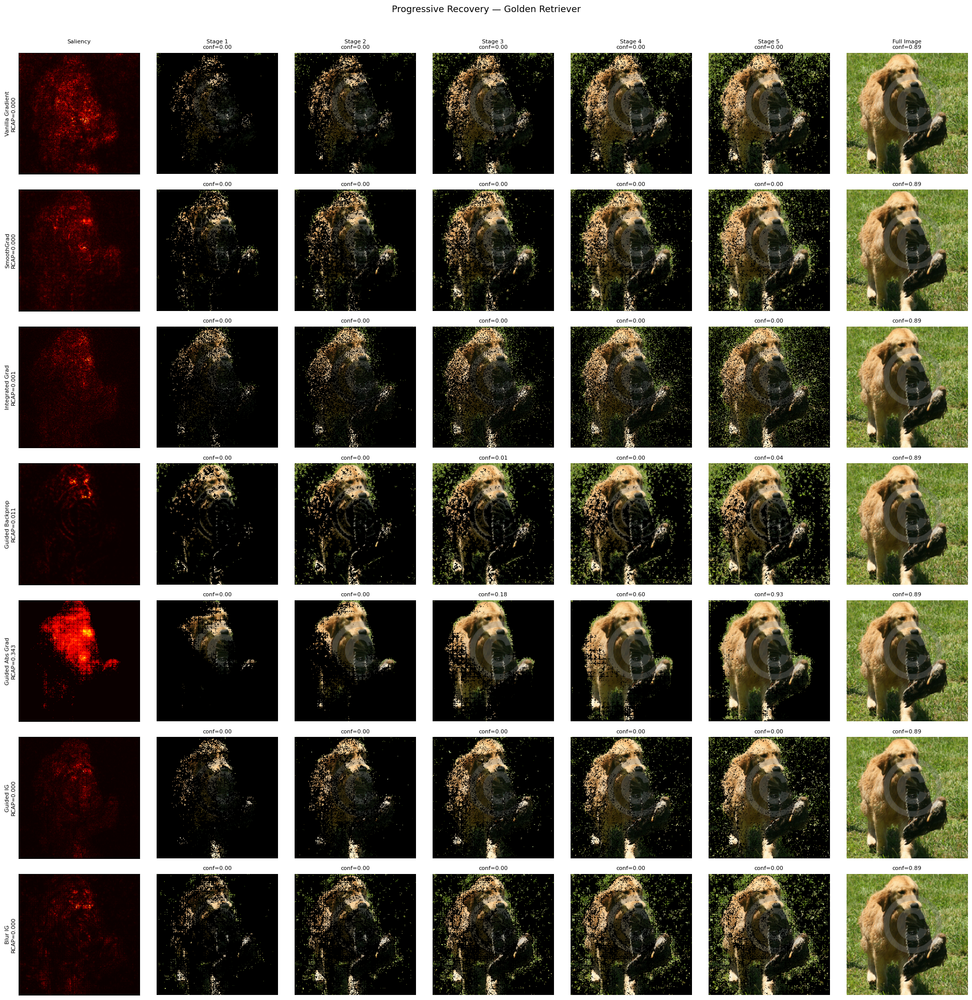

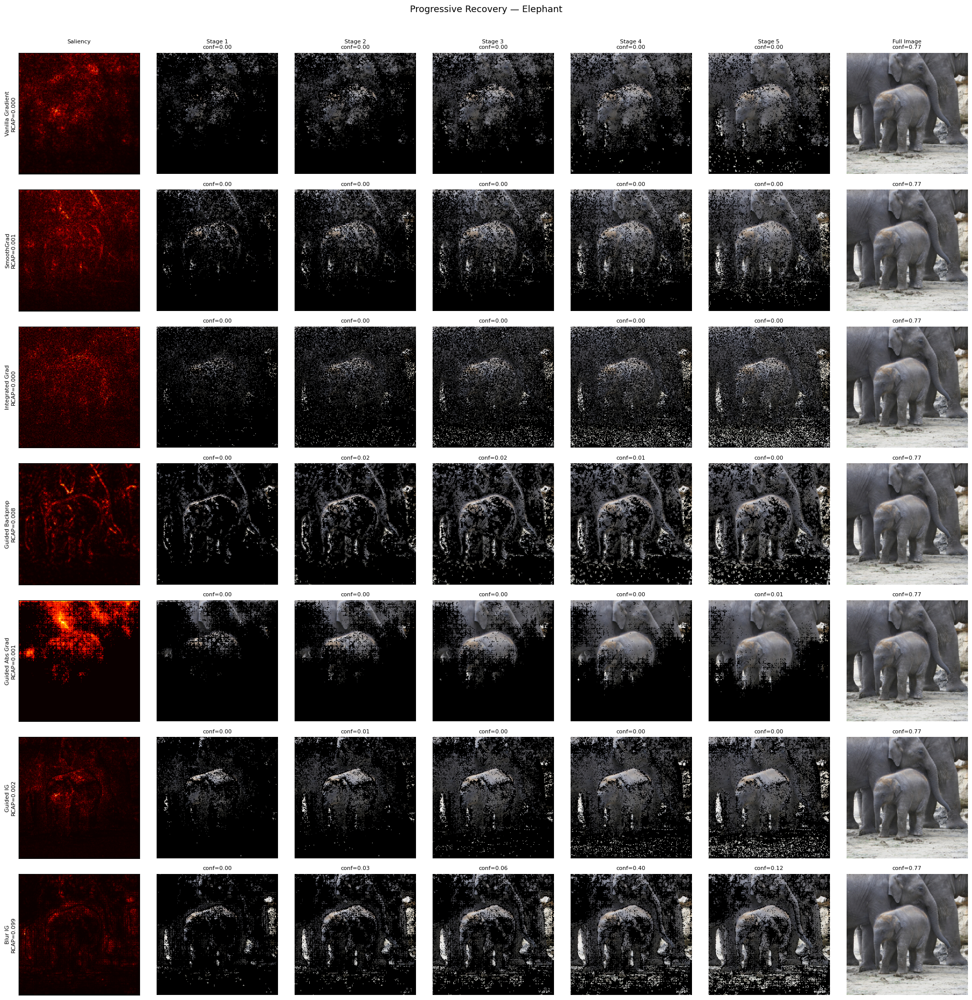

In [16]:
from mlxops_utils import data_utils

LOWER_BOUND = 0.5
RECOVER_INTERVAL = 0.1
N_STAGES = len(torch.arange(LOWER_BOUND, 0.999999, RECOVER_INTERVAL))

VIZ_METHODS = {
    "Vanilla Gradient":  (vanilla_gradient,          {}),
    "SmoothGrad":        (smooth_grad,               {"num_samples": 30}),
    "Integrated Grad":   (integrated_gradients,      {"steps": 30, "trials": 3}),
    "Guided Backprop":   (guided_back_propagation,   {"direction": "positive"}),
    "Guided Abs Grad":   (guided_absolute_grad,      {"num_samples": 30, "aggregation": "guided", "th": 0.85}),
    "Guided IG":         (guided_ig,                 {"num_samples": 15}),
    "Blur IG":           (blur_integrated_gradients, {"num_samples": 20}),
}

mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
images_denorm = data_utils.denormalize(input_tensor)

# Shared RCAP instance — reused across methods via update() + compute() + reset()
rcap_evaluator = RCAP(lower_bound=LOWER_BOUND, recover_interval=RECOVER_INTERVAL)

all_sal  = {}
all_rcap = {}
for mname, (func, kwargs) in VIZ_METHODS.items():
    print(f"Computing {mname}...", end=" ", flush=True)
    sal = func(model, input_tensor, targets, **kwargs)

    # Multi-batch pattern: here the whole dataset is one "batch",
    # but the same update()/compute()/reset() cycle works across any number of batches.
    rcap_evaluator.update(model, (input_tensor, targets), sal)
    res = rcap_evaluator.compute()
    rcap_evaluator.reset()

    all_sal[mname]  = sal.cpu()
    all_rcap[mname] = res
    print("done")

# cols: saliency map | stage 1 ... stage N | full image
n_cols     = 1 + N_STAGES + 1
n_rows     = len(VIZ_METHODS)
col_labels = ["Saliency"] + [f"Stage {i+1}" for i in range(N_STAGES)] + ["Full Image"]

for img_idx, img_name in enumerate(sample_names):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.8 * n_cols, 2.8 * n_rows), dpi=100)

    orig_img   = (input_tensor[img_idx].cpu() * std_t + mean_t).clamp(0, 1).permute(1, 2, 0).numpy()
    img_denorm = images_denorm[img_idx].cpu()

    for r, (mname, sal_all) in enumerate(all_sal.items()):
        sal = sal_all[img_idx]
        recovered_stack, _, _ = rcap_evaluator._build_recovered_image(img_denorm, sal)
        recovered_probs = all_rcap[mname]['recovered_pred_prob'][img_idx]
        orig_prob       = all_rcap[mname]['original_pred_prob'].flatten()[img_idx]
        rcap_score      = all_rcap[mname]['overall_rcap']['RCAP'][img_idx]

        axes[r, 0].imshow(sal.squeeze().numpy(), cmap="hot")
        axes[r, 0].set_ylabel(f"{mname}\nRCAP={rcap_score:.3f}", fontsize=8)
        axes[r, 0].set_xticks([]); axes[r, 0].set_yticks([])

        for s in range(N_STAGES):
            rec = recovered_stack[s].permute(1, 2, 0).clamp(0, 1).numpy()
            axes[r, s + 1].imshow(rec)
            axes[r, s + 1].set_title(f"conf={recovered_probs[s]:.2f}", fontsize=8)
            axes[r, s + 1].axis("off")

        axes[r, -1].imshow(orig_img)
        axes[r, -1].set_title(f"conf={orig_prob:.2f}", fontsize=8)
        axes[r, -1].axis("off")

    for c, label in enumerate(col_labels):
        cur = axes[0, c].get_title()
        axes[0, c].set_title(f"{label}\n{cur}", fontsize=8)

    fig.suptitle(f"Progressive Recovery — {img_name.replace('_', ' ').title()}", fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

## 6. Compare RCAP Scores Across Methods

Use the multi-batch `update()` + `compute()` pattern to evaluate all XAI methods.
Higher RCAP = saliency map focuses on more causally important regions.

In [17]:
# Reuse results already computed in Section 4
rcap_results = {m: all_rcap[m]['overall_rcap']['RCAP'] for m in all_rcap}

## 6. Visualize RCAP Comparison

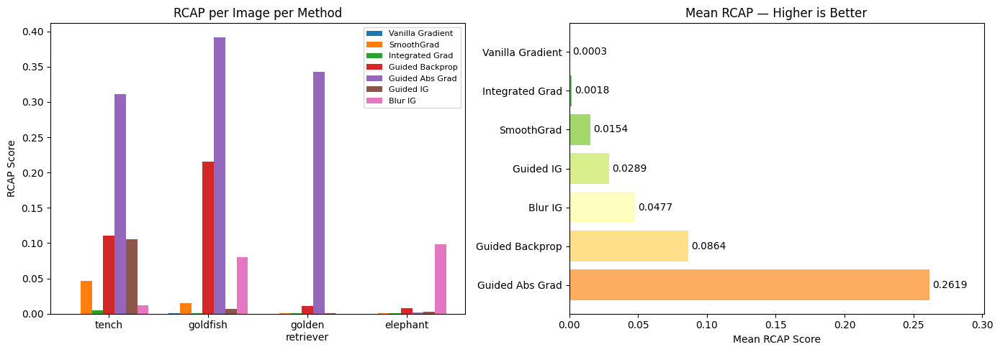

In [18]:
method_names = list(rcap_results.keys())
scores = np.array([rcap_results[m] for m in method_names])  # (n_methods, n_images)
mean_scores = scores.mean(axis=1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: grouped bar chart — RCAP per image per method
x = np.arange(len(sample_names))
width = 0.8 / len(method_names)
for i, (method, s) in enumerate(zip(method_names, scores)):
    axes[0].bar(x + i * width, s, width, label=method)
axes[0].set_xticks(x + width * (len(method_names) - 1) / 2)
axes[0].set_xticklabels([n.replace("_", "\n") for n in sample_names])
axes[0].set_ylabel("RCAP Score")
axes[0].set_title("RCAP per Image per Method")
axes[0].legend(fontsize=8, loc="upper right")
axes[0].set_ylim(0, None)

# Right: mean RCAP per method (sorted)
order = np.argsort(mean_scores)[::-1]
colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(method_names)))
bars = axes[1].barh(
    [method_names[i] for i in order],
    [mean_scores[i] for i in order],
    color=colors
)
axes[1].bar_label(bars, fmt="%.4f", padding=3)
axes[1].set_xlabel("Mean RCAP Score")
axes[1].set_title("Mean RCAP — Higher is Better")
axes[1].set_xlim(0, mean_scores.max() * 1.15)

plt.tight_layout()
plt.show()